# Covid-19: Análisis del progreso de la vacunación mundial

In [152]:
#!pip install a-world-of-countries

In [153]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import pylab
import scipy.stats as ss
import csv
import awoc
import numpy as np
import sklearn
from sklearn import datasets
import plotly.graph_objs as go

import pandas_profiling as pp
import pandas.util.testing as tm

import kaggle
import os


In [154]:
import zipfile

In [259]:
!chmod 600 ~/.kaggle/kaggle.json

In [155]:
kaggle.api.authenticate()

In [156]:
import os
#os.environ['KAGGLE_USERNAME'] = "carlosbgdlv" # username from the json file
#os.environ['KAGGLE_KEY'] = "872fe59349b4da02f837f243c6533328" # key from the json file

os.environ['KAGGLE_USERNAME'] = "gemaprez" # username from the json file
os.environ['KAGGLE_KEY'] = "0c7653649699c2a7ebd5b87331fd8669" # key from the json file

In [157]:
#!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations
!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations_by_manufacturer.csv --force
!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations.csv --force

  0%|                                                | 0.00/139k [00:00<?, ?B/s]
100%|████████████████████████████████████████| 139k/139k [00:00<00:00, 2.20MB/s]
100%|████████████████████████████████████████| 338k/338k [00:00<00:00, 2.32MB/s]
100%|████████████████████████████████████████| 338k/338k [00:00<00:00, 2.30MB/s]


In [158]:
#path_to_zip_file = "C:/Users/ywen2/Desktop/URJC/BACKUP PROCESADO/country_vaccinations.csv.zip"
#directory_to_extract_to= "C:/Users/ywen2/Desktop/URJC/BACKUP PROCESADO"

path_to_zip_file = "/Users/gema/Documents/Github/PROCESADO_MASIVO_DE_DATOS/country_vaccinations.csv.zip"
directory_to_extract_to= "/Users/gema/Documents/Github/PROCESADO_MASIVO_DE_DATOS"

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [159]:
df = pd.read_csv("country_vaccinations.csv")
df2 = pd.read_csv("covid19_country_population.csv")
df_manufacturers = ("country_vaccinations_by_manufacturer.csv")

## 1.Descripción de la base de datos

#### Variables


1. **Country:** es el país para el que se proporciona la información sobre la vacunación;
2. **Country ISO Code** - código ISO del país;
3. **Fecha** - fecha para la entrada de datos; para algunas de las fechas tenemos sólo las vacunas diarias, para otras, sólo el total (acumulado);
3. **Total number of vaccinations** - es el número absoluto de vacunas totales en el país;
4. **Total number of people vaccinated** - una persona, dependiendo del esquema de vacunación, recibirá una o más (normalmente 2) vacunas; en un momento dado, el número de vacunaciones puede ser mayor que el número de personas;
5. **Número total de personas totalmente vacunadas** - es el número de personas que recibieron todo el conjunto de vacunas según el esquema de inmunización (típicamente 2); en un momento determinado, puede haber un cierto número de personas que recibieron una vacuna y otro número (menor) de personas que recibieron todas las vacunas del esquema;
6. **Daily vaccinations (raw):** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
7. **Daily vaccinations:** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
8. **Total vaccinations per hundred** - relación (en porcentaje) entre el número de vacunaciones y la población total hasta la fecha en el país;
9. **Total number of people vaccinated per hundred**  - relación (en porcentaje) entre la población vacunada y la población total hasta la fecha en el país;
10. **Total number of people fully vaccinated per hundred** - relación (en porcentaje) entre la población totalmente vacunada y la población total hasta la fecha en el país;
11. **Number of vaccinations per day** - número de vacunaciones diarias para ese día y país;
    Daily vaccinations per million  - relación (en ppm) entre el número de vacunaciones y la población total para la fecha en el país;
12. **Vaccines** - El tipo de vacunas utilizadas en el país;
13. **Source name** - fuente de la información (autoridad nacional, organización internacional, organización local, etc.);
14. **Source website**  - sitio web de la fuente de información.


In [160]:
df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...


In [161]:
df2.head()

,CountryAlpha3Code,Population
0,ABW,106314.0
1,AFG,38041754.0
2,AGO,31825295.0
3,ALB,2854191.0
4,AND,77142.0


In [162]:
#getting a profile summary
pp.ProfileReport(df)

In [163]:
df2 = df2.rename(columns={'CountryAlpha3Code': 'iso_code'})

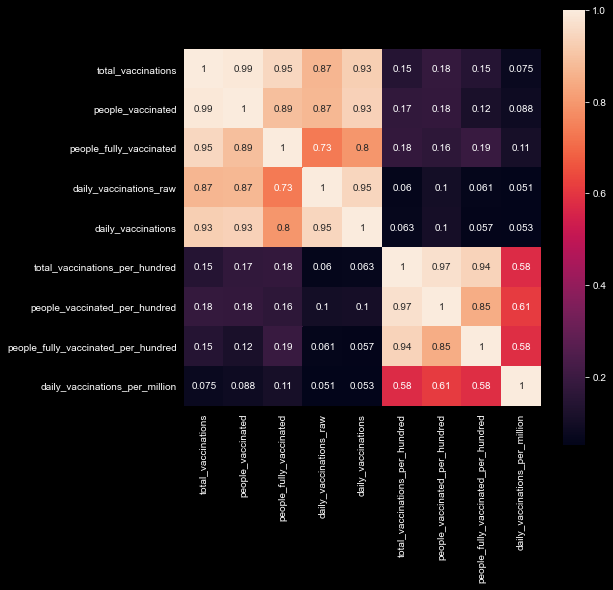

In [164]:
#correlation
plt.style.use('dark_background')
plt.subplots(figsize=(8, 8))
sns.heatmap(df.corr() , annot=True, square=True )
plt.show()

Eliminamos la columna daily_vaccinations_raw, ya que es una versión "a sucio" de daily_vaccinations

In [165]:
df = df.drop('daily_vaccinations_raw', axis=1)

Ponemos la fecha en nuestro formato y ordenamos los datos por fechas de vacunación (de la más antigua a la más actual)

In [166]:
df.dtypes

country                                 object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
daily_vaccinations_per_million         float64
vaccines                                object
source_name                             object
source_website                          object
dtype: object

In [167]:
df['date'] = pd.to_datetime(df['date'])
#df = df.sort_values('date', ascending=True)

df['date'] = df['date'].dt.strftime('%Y-%m-%d')

In [168]:
df[['date']] = df[['date']].apply(pd.to_datetime)

In [169]:
df.dtypes

country                                        object
iso_code                                       object
date                                   datetime64[ns]
total_vaccinations                            float64
people_vaccinated                             float64
people_fully_vaccinated                       float64
daily_vaccinations                            float64
total_vaccinations_per_hundred                float64
people_vaccinated_per_hundred                 float64
people_fully_vaccinated_per_hundred           float64
daily_vaccinations_per_million                float64
vaccines                                       object
source_name                                    object
source_website                                 object
dtype: object

In [170]:
#df['country'] = df['country'].astype(str)
#df['iso_code'] = df['iso_code'].astype(str)
#df['vaccines'] = df['vaccines'].astype(str)
#df['source_name'] = df['source_name'].astype(str)
#df['source_website'] = df['source_website'].astype(str)

Combinamos con un pd.join los dos dataframe para tener en un mismo dataframe los datos de vacunación y los de población.

In [171]:
# Combining the two datasets using pd.join, ensuring that three common columns are used as the index.

#df_1 = df.set_index(['iso_code', 'date'])
df_1 = df.set_index('iso_code')
df_2 = df2.set_index('iso_code')
covid_vaccine_data = df_1.join(df_2)
covid_vaccine_data.head(5)

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
ABW,Aruba,2021-03-29,25766.0,15600.0,10166.0,NaN,24.13,14.61,9.52,NaN,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-03-30,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-03-31,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-04-01,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-04-02,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0


In [172]:
print('Data point starts from ',covid_vaccine_data.date.min(),'\n')
print('Data point ends at ',covid_vaccine_data.date.max(),'\n')
print('Total no of countries in the data set ',len(covid_vaccine_data.country.unique()),'\n')
print('Total no of unique vaccines in the data set ',len(covid_vaccine_data.vaccines.unique()),'\n')

Data point starts from  2020-12-14 00:00:00 

Data point ends at  2021-05-06 00:00:00 

Total no of countries in the data set  196 

Total no of unique vaccines in the data set  34 



Con unique_dates podemos saber que días se ha vacunado (teniendo en cuenta todos los países)

In [173]:
covid_vaccine_data['vaccines'].unique()

array(['Pfizer/BioNTech', 'Oxford/AstraZeneca',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V',
       'Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V', 'Sputnik V',
       'Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Sinovac',
       'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
       'Moderna, Pfizer/BioNTech', 'Pfizer/BioNTech, Sinovac',
       'Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac', 'Sinopharm/Beijing',
       'Sinopharm/Beijing, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
       'Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac',
       'Oxford/AstraZeneca, Sinopharm/Beijing',
       'Moderna, Oxford/AstraZeneca',
       'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sinop

In [174]:
import plotly.express as px

In [175]:
unique_dates = df['date'].unique()
#unique_dates = covid_vaccine_data['date'].unique()
type(unique_dates[0])

numpy.datetime64

In [176]:
covid_vaccine_data.sort_values(by = 'date')

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
CAN,Canada,2020-12-14,5.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Official data from provinces via covid19tracke...,https://covid19tracker.ca/vaccinationtracker.html,3.758926e+07
CAN,Canada,2020-12-15,723.0,NaN,NaN,718.0,0.00,NaN,NaN,19.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Official data from provinces via covid19tracke...,https://covid19tracker.ca/vaccinationtracker.html,3.758926e+07
CHN,China,2020-12-15,1500000.0,NaN,NaN,NaN,0.10,NaN,NaN,NaN,"Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac",National Health Commission,http://www.nhc.gov.cn/xcs/yqjzqk/202105/e129e5...,1.397715e+09
RUS,Russia,2020-12-15,28500.0,28500.0,NaN,NaN,0.02,0.02,NaN,NaN,"EpiVacCorona, Sputnik V",Official data from local governments via gogov.ru,https://gogov.ru/articles/covid-v-stats,1.443735e+08
CAN,Canada,2020-12-16,3023.0,NaN,NaN,1509.0,0.01,NaN,NaN,40.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Official data from provinces via covid19tracke...,https://covid19tracker.ca/vaccinationtracker.html,3.758926e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LBN,Lebanon,2021-05-06,509705.0,325383.0,184322.0,6935.0,7.47,4.77,2.70,1016.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",Government of Lebanon,https://impact.cib.gov.lb/home/dashboard/vaccine,6.855713e+06
LCA,Saint Lucia,2021-05-06,24773.0,NaN,NaN,78.0,13.49,NaN,NaN,425.0,Oxford/AstraZeneca,Ministry of Health,https://www.covid19response.lc/,1.827900e+05
LKA,Sri Lanka,2021-05-06,1088093.0,928107.0,159986.0,22072.0,5.08,4.33,0.75,1031.0,"Oxford/AstraZeneca, Sinopharm/Beijing",Ministry of Health's Epidemiology Unit,https://www.epid.gov.lk/web/images/pdf/corona_...,2.180300e+07


## 2. Preprocesado

### 2. 1 Missing Data

Veamos el número de NaN que tenemos por columnas

In [177]:
covid_vaccine_data.isnull().sum()/len(covid_vaccine_data)*100

country                                 0.000000
date                                    0.000000
total_vaccinations                     39.761266
people_vaccinated                      44.121026
people_fully_vaccinated                58.496106
daily_vaccinations                      1.283033
total_vaccinations_per_hundred         39.761266
people_vaccinated_per_hundred          44.121026
people_fully_vaccinated_per_hundred    58.496106
daily_vaccinations_per_million          1.283033
vaccines                                0.000000
source_name                             0.000000
source_website                          0.000000
Population                              7.251372
dtype: float64

In [178]:
print("Vaccination date starts from ",unique_dates[0]," till ",unique_dates[-1])
print("Total Countries vaccinated :",len(covid_vaccine_data["country"].unique()))
print("Total Vaccines  :",len(covid_vaccine_data["vaccines"].unique()))

Vaccination date starts from  2021-02-22T00:00:00.000000000  till  2020-12-22T00:00:00.000000000
Total Countries vaccinated : 196
Total Vaccines  : 34


Estadísticas descriptivas que muestran la tendencia central, la dispersión y la forma de la distribución de un conjunto de datos, excluyendo los valores NaN.

In [179]:
covid_vaccine_data.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,Population
count,9.437000e+03,8.754000e+03,6.502000e+03,1.546500e+04,9437.000000,8754.000000,6502.000000,15465.000000,1.453000e+04
mean,5.250013e+06,3.302754e+06,1.672178e+06,7.948445e+04,16.130694,11.678865,5.945094,3007.500873,5.307837e+07
std,2.163269e+07,1.233716e+07,7.225403e+06,3.641596e+05,23.841769,15.622004,10.306655,4693.064582,1.859896e+08
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.258100e+04
25%,6.306400e+04,5.403675e+04,2.461400e+04,9.100000e+02,1.400000,1.312500,0.660000,356.000000,1.912789e+06
50%,4.462850e+05,3.398010e+05,1.818105e+05,6.495000e+03,6.650000,5.130000,2.480000,1504.000000,8.877067e+06
75%,2.003211e+06,1.387596e+06,7.228470e+05,3.003600e+04,20.850000,15.510000,6.760000,4020.000000,3.426853e+07
max,2.977340e+08,1.494623e+08,1.089266e+08,7.205286e+06,215.710000,112.750000,102.950000,118759.000000,1.397715e+09


In [180]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population'],
      dtype='object')

Vemos la cantidad de NaN que hay en el dataset:

In [181]:
covid_vaccine_data.isnull().sum()

country                                   0
date                                      0
total_vaccinations                     6229
people_vaccinated                      6912
people_fully_vaccinated                9164
daily_vaccinations                      201
total_vaccinations_per_hundred         6229
people_vaccinated_per_hundred          6912
people_fully_vaccinated_per_hundred    9164
daily_vaccinations_per_million          201
vaccines                                  0
source_name                               0
source_website                            0
Population                             1136
dtype: int64

### 2.2 Interpolación lineal

Vamos a estimar el valor de los valores faltantes mediante una interpolación lineal. Esto l

In [182]:
covid_vaccine_data.isnull().sum()

country                                   0
date                                      0
total_vaccinations                     6229
people_vaccinated                      6912
people_fully_vaccinated                9164
daily_vaccinations                      201
total_vaccinations_per_hundred         6229
people_vaccinated_per_hundred          6912
people_fully_vaccinated_per_hundred    9164
daily_vaccinations_per_million          201
vaccines                                  0
source_name                               0
source_website                            0
Population                             1136
dtype: int64

# **EDA** : Análisis exploratorio de los datos

Vamos a proceder a obtener 4 dataframes de continentes diferentes para el posterior análisis de los datos. 

In [183]:
# Initialize the AWOC class.
my_world = awoc.AWOC()

#### Europe

In [184]:
nations_of_europe = my_world.get_countries_list_of('Europe')

In [185]:
europe = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_europe)]

#### Asia

In [186]:
nations_of_asia = my_world.get_countries_list_of('Asia')

In [187]:
asia = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_asia)]
print(asia.shape)

(3617, 14)


#### Africa

In [188]:
nations_of_africa = my_world.get_countries_list_of('Africa')

In [189]:
africa = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_africa)]
print(africa.shape)

(1766, 14)


#### Norte América

In [190]:
nations_of_north_america = my_world.get_countries_list_of('North America')

In [191]:
north_america = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_north_america)]
print(north_america.shape)

(2364, 14)


### 1.Progreso del número de inmunizaciones

VAMOS A OBTENER EL PAÍS DE CADA CONTINENTE CON MAYOR NÚMERO DE PERSONAS VACUNADAS Y COMPARARLOS ENTRE SI. 

In [192]:
max_ = europe[europe['total_vaccinations'] == np.max(europe['total_vaccinations'])][['country','total_vaccinations']]
max_1 = africa[africa['total_vaccinations'] == np.max(africa['total_vaccinations'])][['country','total_vaccinations']]
max_2 = asia[asia['total_vaccinations'] == np.max(asia['total_vaccinations'])][['country','total_vaccinations']]
max_3 = north_america[north_america['total_vaccinations'] == np.max(north_america['total_vaccinations'])][['country','total_vaccinations']]


print(max_)
print(max_1)
print(max_2)
print(max_3)

                 country  total_vaccinations
iso_code                                    
GBR       United Kingdom          51225890.0
          country  total_vaccinations
iso_code                             
MAR       Morocco           9680954.0
         country  total_vaccinations
iso_code                            
CHN        China         297734000.0
                country  total_vaccinations
iso_code                                   
USA       United States         251973752.0


Número de pacientes vacunados por país (elegimos el continente del que queremos obtener los datos)

In [193]:
res = europe.groupby("country")["total_vaccinations"].agg(Numero_pacientes_vacunados="max")
#print(res)

In [194]:
vacc_GBR = europe.loc[europe.country == 'United Kingdom']
vacc_Morocco = africa.loc[africa.country == 'Morocco']
vacc_China = asia.loc[asia.country == 'China']
vacc_United_States = north_america.loc[north_america.country == 'United States']
total_vaccination = pd.concat([vacc_GBR, vacc_Morocco, vacc_China, vacc_United_States])

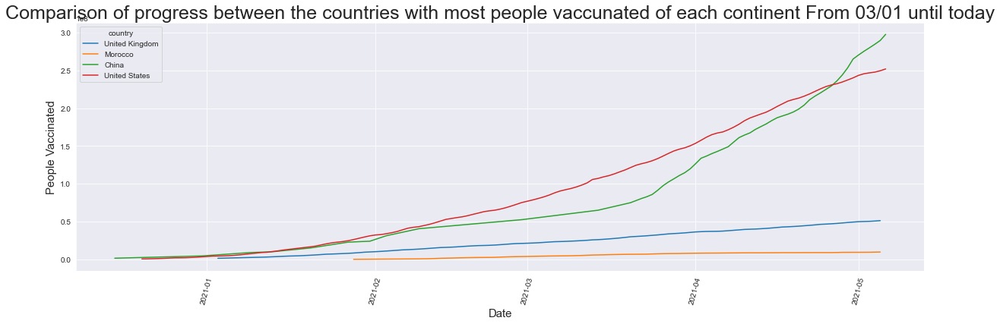

In [195]:
sns.set_style("darkgrid")
#plt.style.use('dark_background')
plt.figure(figsize=(20,6))
sns.lineplot(data= total_vaccination, x='date', y='total_vaccinations', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people vaccunated of each continent From 03/01 until today',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('People Vaccinated', fontsize=15)
plt.style.use('dark_background')
plt.show()


### 2.Daily vaccinations

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



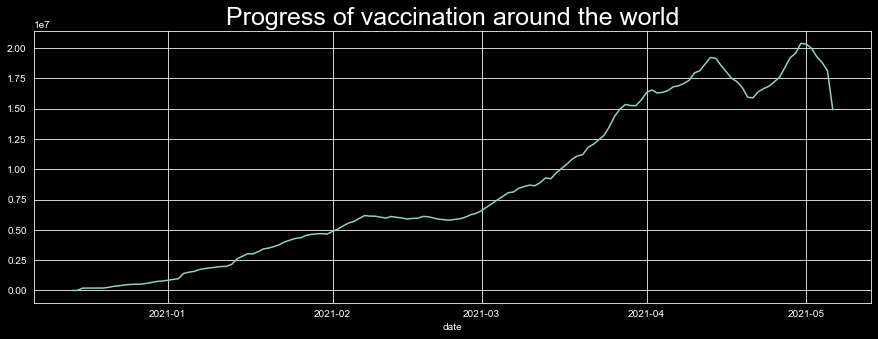

In [196]:
#daily vaccinations en todo el mundo
x= covid_vaccine_data.groupby("date").daily_vaccinations.sum()
plt.figure(figsize= (15,5))
sns.lineplot(x.index,x.values)
plt.title('Progress of vaccination around the world',fontsize=25)
plt.show()


### 3. Población con mayor número de pacientes vacunados con las dos dosis en %

Además, también podemos estudiar en qué país está más avanzado el programa de vacunación. Para ello, tenemos que centrarnos en la variable **"people_fully_vaccinated_per_hundred"**. Esta varible refleja el ratio de la población totalmente inmunizada y la población total hasta la fecha en el país. Es importante tener en consideración este ratio porque no todos los países tienen la misma cantidad de población.


In [197]:
max_ = europe[europe['people_fully_vaccinated_per_hundred'] == np.max(europe['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_1 = africa[africa['people_fully_vaccinated_per_hundred'] == np.max(africa['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_2 = asia[asia['people_fully_vaccinated_per_hundred'] == np.max(asia['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_3 = north_america[north_america['people_fully_vaccinated_per_hundred'] == np.max(north_america['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]

print(max_)
print(max_1)
print(max_2)
print(max_3)

            country  people_fully_vaccinated_per_hundred
iso_code                                                
GIB       Gibraltar                               102.95
             country  people_fully_vaccinated_per_hundred
iso_code                                                 
SYC       Seychelles                                60.68
         country  people_fully_vaccinated_per_hundred
iso_code                                             
ISR       Israel                                 58.6
                 country  people_fully_vaccinated_per_hundred
iso_code                                                     
CYM       Cayman Islands                                49.47


In [198]:
max_3

,country,people_fully_vaccinated_per_hundred
iso_code,,
CYM,Cayman Islands,49.47


In [199]:
max_3['country'][0]

'Cayman Islands'

In [200]:
res = europe.groupby("country")["people_fully_vaccinated_per_hundred"].agg(Numero_pacientes_vacunados="max")
vacc_Gibraltar = europe.loc[europe.country == max_['country'][0]]
#vacc_Seychelles = africa.loc[africa.country == max_1['country'][0]]
vacc_Seychelles = africa.loc[africa.country == 'Seychelles']
#vacc_Israel = asia.loc[asia.country == max_2['country'][0]]
vacc_Israel = asia.loc[asia.country == 'Israel']
#vacc_NorthAmerica = north_america.loc[north_america.country == max_3['country'][0]]
vacc_NorthAmerica = north_america.loc[north_america.country == 'Cayman Islands']
inmunized = pd.concat([vacc_Gibraltar, vacc_Seychelles, vacc_Israel, vacc_NorthAmerica ])

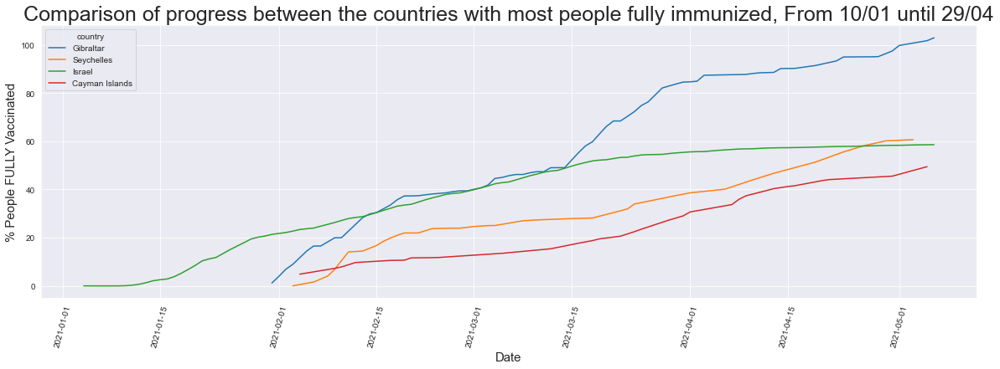

In [201]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data= inmunized, x='date', y='people_fully_vaccinated_per_hundred', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people fully immunized, From 10/01 until 29/04',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('% People FULLY Vaccinated', fontsize=15)
plt.show()

De este gráfico se pueden deducir varias cosas:

- El país que está más avanzado en su campaña de población es Gibraltar. Una de las razones principales a las que se debe esto, es que Gibraltar es un territorio pequeño (6,8 km^2) con una población de alrededor de 33000 personas. Se observa como alcanza la inmunidad de rebaño (70%) a mediados de marzo y continua subiendo. 

- Por otro lado, el segundo del mundo con mayor porcentaje de población totalmente inmunizada es Israel. Se aprecia como tiene un crecimiento bastante constante a medida que pasa el tiempo, hasta llegar a una estepa poco antes del 60%. 

- Las islas Caimán y las Seychelles comienzan su vacunación un poco más tarde, pero al ser también territorios con menos de 100000 personas, su ratio de inmunización es más elevado que otros territorios de su mismo continente. 

### 4. Top countries with fully  vaccinated people

In [202]:
covid_vaccine_data["Full_vaccinations(count)"] = covid_vaccine_data.groupby("country").people_fully_vaccinated.tail(1)
covid_vaccine_data.groupby("country")["Full_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
United States     108926627.0
India              31544713.0
United Kingdom     16291719.0
Brazil             15037978.0
England            13632735.0
Turkey             10076124.0
Mexico              8790655.0
Indonesia           8339055.0
Russia              8284150.0
Germany             7360108.0
France              7238601.0
Chile               6993123.0
Italy               6877239.0
Spain               5696827.0
Israel              5071821.0
Morocco             4346867.0
Poland              3451651.0
Bangladesh          3313424.0
Hungary             2315428.0
Romania             2138703.0
Name: Full_vaccinations(count), dtype: float64

Para tener una idea más gráfica de como va la vacunación mundial representamos el número de vacunas en un mapa:

In [203]:
fig = go.Figure(data=go.Choropleth(locations = covid_vaccine_data['country'],
                            locationmode='country names',
                            z = covid_vaccine_data["Full_vaccinations(count)"],
                            text = covid_vaccine_data['country'],       
                            colorscale = 'Reds',
                            autocolorscale=False,
                            marker_line_color='darkgray',
                            marker_line_width=0.5,
                        
                          ))

fig.update_layout(
    title_text='MAPA DE VACUNACIONES TOTALES: DOS DOSIS',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ))
fig.show()

In [204]:
covid_vaccine_data["Total_vaccinations(count)"] = covid_vaccine_data.groupby("country").total_vaccinations.tail(1)
covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
China                   297734000.0
United States           251973752.0
India                   162603603.0
United Kingdom           51225890.0
Brazil                   46542392.0
England                  42864836.0
Germany                  33565445.0
Turkey                   24467719.0
France                   23949989.0
Italy                    22644364.0
Indonesia                21367754.0
Russia                   21177713.0
Mexico                   19951121.0
Spain                    18489580.0
Chile                    15296805.0
Canada                   14924694.0
Poland                   13034348.0
United Arab Emirates     10907264.0
Israel                   10489167.0
Saudi Arabia             10065924.0
Name: Total_vaccinations(count), dtype: float64

In [205]:
fig = go.Figure(data=go.Choropleth(locations = covid_vaccine_data['country'],
                            locationmode='country names',
                            z = covid_vaccine_data["Total_vaccinations(count)"],
                            text = covid_vaccine_data['country'],       
                            colorscale = 'Reds',
                            autocolorscale=False,
                            marker_line_color='darkgray',
                            marker_line_width=0.5,
                        
                          ))

fig.update_layout(
    title_text='MAPA DE AL MENOS UNA DOSIS SUMINISTRADA',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ))
fig.show()

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



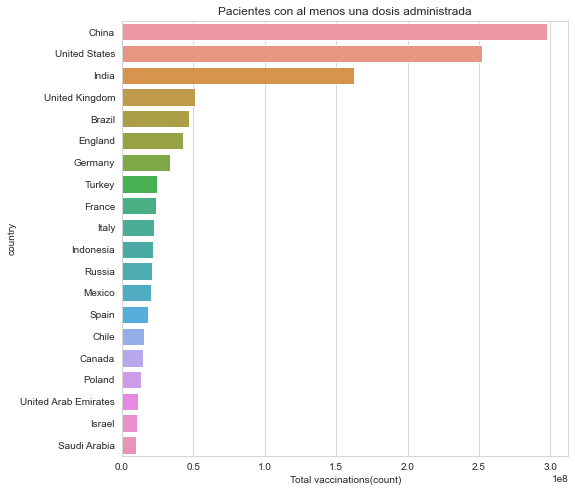

In [206]:
x= covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total vaccinations(count)")
plt.title('Pacientes con al menos una dosis administrada')
plt.show()

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



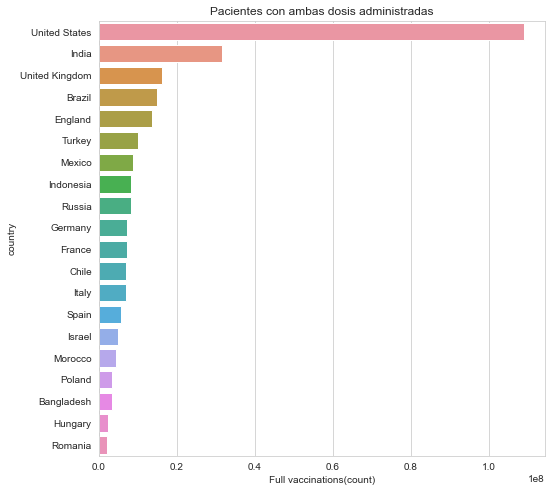

In [207]:
x= covid_vaccine_data.groupby("country")["Full_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Full vaccinations(count)")
plt.title('Pacientes con ambas dosis administradas')
plt.show()

En este segundo gráfico no aparece China porque no aporta datos suficientes respecto a la inoculación de las dos dosis de vacunas en su población. 

### 5. Correlación

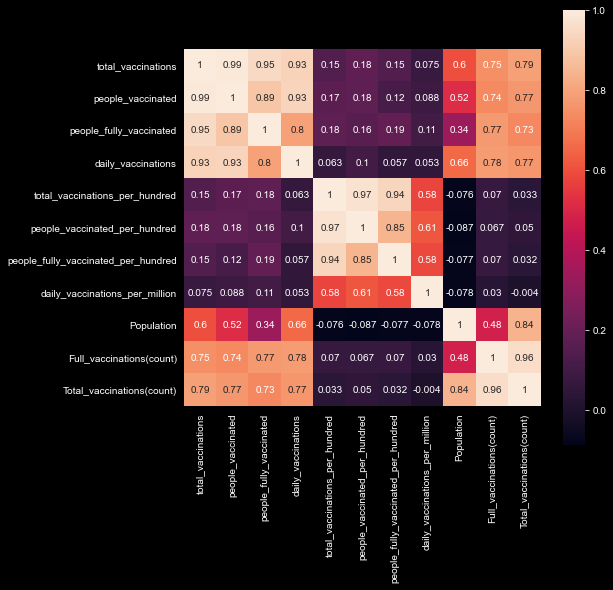

In [208]:
#correlation
plt.style.use('dark_background')
plt.subplots(figsize=(8, 8))
sns.heatmap(covid_vaccine_data.corr() , annot=True, square=True )
plt.show()

# OBSEVANDO EL MAPA DE CORRELACIÓN PODEMOS DEDUCIR QUE LAS VARIABLES TOTAL_VACCINATION Y PEOPLE_VACCINATED NOS APORTAN LA MISMA INFORMACIÓN (0.99 DE CORRELACIÓN)

### 6. Vacunas

Encontrar cuales son los países que más han utilizado un tipo de vacuna. 

In [209]:
#most common vaccines
covid_vaccine_data.vaccines.value_counts()

Oxford/AstraZeneca                                                                    2607
Moderna, Oxford/AstraZeneca, Pfizer/BioNTech                                          2389
Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech                         1532
Oxford/AstraZeneca, Pfizer/BioNTech                                                   1418
Pfizer/BioNTech                                                                       1227
Moderna, Pfizer/BioNTech                                                               604
Oxford/AstraZeneca, Sinopharm/Beijing                                                  587
Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac                                           499
Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V                      487
Oxford/AstraZeneca, Sinovac                                                            472
Sputnik V                                                                              438

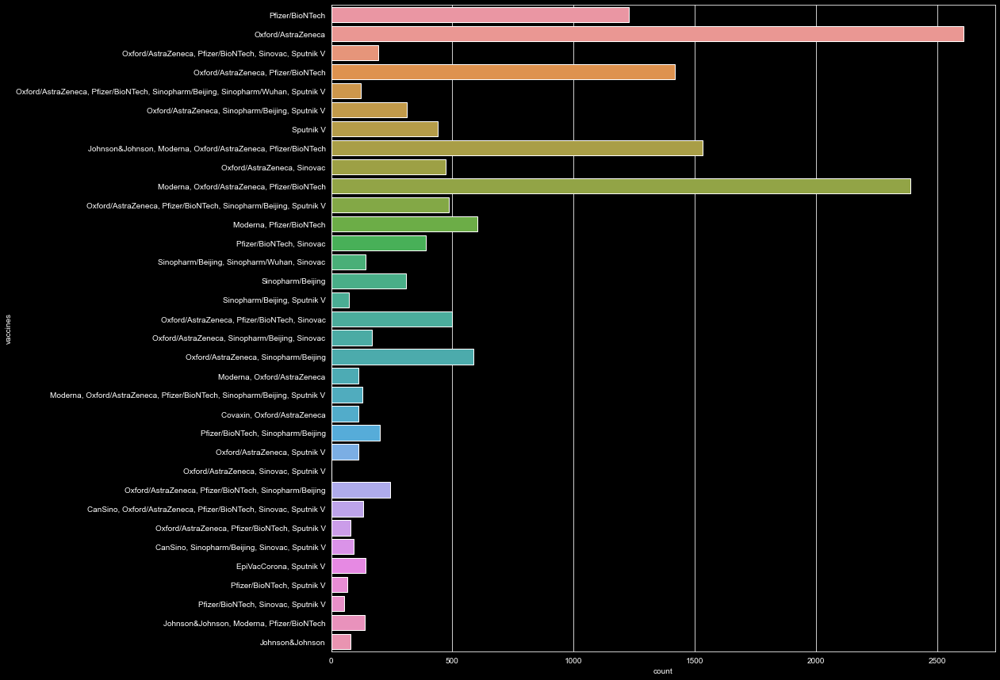

In [210]:
plt.figure(figsize=(15,15))
sns.countplot(y= "vaccines",data= covid_vaccine_data)
plt.show()

In [211]:
cntry_vaccine = covid_vaccine_data.groupby(["country", "iso_code", "vaccines"])['total_vaccinations', 
                                                                       'total_vaccinations_per_hundred',
                                                                      'daily_vaccinations',
                                                                      'daily_vaccinations_per_million',
                                                                      'people_vaccinated',
                                                                      'people_vaccinated_per_hundred',
                                                                       'people_fully_vaccinated', 
                                                                       'people_fully_vaccinated_per_hundred'
                                                                      ].max().reset_index()

cntry_vaccine.columns = ["Country", "iso_code", "Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million", "People vaccinated", "People vaccinated per hundred",
                           'People fully vaccinated', 'People fully vaccinated percent']

<ipython-input-211-5ca0293ab71a>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [212]:
cntry_vaccine.head(10)

,Country,iso_code,Vaccines,Total vaccinations,Percent,Daily vaccinations,Daily vaccinations per million,People vaccinated,People vaccinated per hundred,People fully vaccinated,People fully vaccinated percent
0,Afghanistan,AFG,Oxford/AstraZeneca,240000.0,0.62,8000.0,206.0,240000.0,0.62,NaN,NaN
1,Albania,ALB,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",572226.0,19.88,17565.0,6104.0,6073.0,0.21,655.0,0.02
2,Algeria,DZA,Sputnik V,75000.0,0.17,3748.0,85.0,NaN,NaN,NaN,NaN
3,Andorra,AND,"Oxford/AstraZeneca, Pfizer/BioNTech",28881.0,37.38,1182.0,15298.0,24182.0,31.30,4699.0,6.08
4,Angola,AGO,Oxford/AstraZeneca,456349.0,1.39,18751.0,571.0,456349.0,1.39,NaN,NaN
5,Anguilla,AIA,Oxford/AstraZeneca,6898.0,45.98,331.0,22064.0,6115.0,40.76,783.0,5.22
6,Antigua and Barbuda,ATG,Oxford/AstraZeneca,29754.0,30.38,895.0,9139.0,29754.0,30.38,NaN,NaN
7,Argentina,ARG,"Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V",8591061.0,19.01,169014.0,3740.0,7399515.0,16.37,1191546.0,2.64
8,Armenia,ARM,Sputnik V,565.0,0.02,NaN,NaN,565.0,0.02,NaN,NaN
9,Aruba,ABW,Pfizer/BioNTech,79553.0,74.51,2493.0,23350.0,55371.0,51.86,24182.0,22.65


In [213]:
vaccince_types = cntry_vaccine.groupby(['Vaccines'])['iso_code'].unique()
vaccince_types = vaccince_types.reset_index()
vaccince_types

,Vaccines,iso_code
0,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[MEX]
1,"CanSino, Sinopharm/Beijing, Sinovac, Sputnik V",[PAK]
2,"Covaxin, Oxford/AstraZeneca",[IND]
3,"EpiVacCorona, Sputnik V",[RUS]
4,Johnson&Johnson,[ZAF]
5,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...","[AUT, BEL, CZE, FRA, DEU, ITA, LVA, LTU, NLD, ..."
6,"Johnson&Johnson, Moderna, Pfizer/BioNTech",[USA]
7,"Moderna, Oxford/AstraZeneca","[GTM, HND]"
8,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech","[BGR, CAN, HRV, DNK, OWID_ENG, EST, FIN, GRC, ..."
9,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[HUN]


In [214]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population',
       'Full_vaccinations(count)', 'Total_vaccinations(count)'],
      dtype='object')

In [215]:
covid_vaccine_data.reset_index(inplace=True)

In [216]:
info_vaccines = covid_vaccine_data[['iso_code', 'vaccines']].drop_duplicates()
info_vaccines.shape

(196, 2)

### Registro por país de cada tipo de vacuna utilizada.

In [217]:
#create dataframe with one record for each country and type of vaccine used
map_plot_df = pd.concat([pd.Series(row['iso_code'], row['vaccines'].split(','))              
                         for _, row in info_vaccines.iterrows()]).reset_index()
#rename columns
map_plot_df.columns = ['vaccine', 'iso_code']

#strip white spaces
map_plot_df['vaccine'] = map_plot_df['vaccine'].str.strip(' ')

map_plot_df.vaccine.value_counts()

Oxford/AstraZeneca    146
Pfizer/BioNTech        92
Moderna                42
Sinopharm/Beijing      38
Sputnik V              32
Sinovac                24
Johnson&Johnson        14
CanSino                 2
Sinopharm/Wuhan         2
EpiVacCorona            1
Covaxin                 1
Name: vaccine, dtype: int64

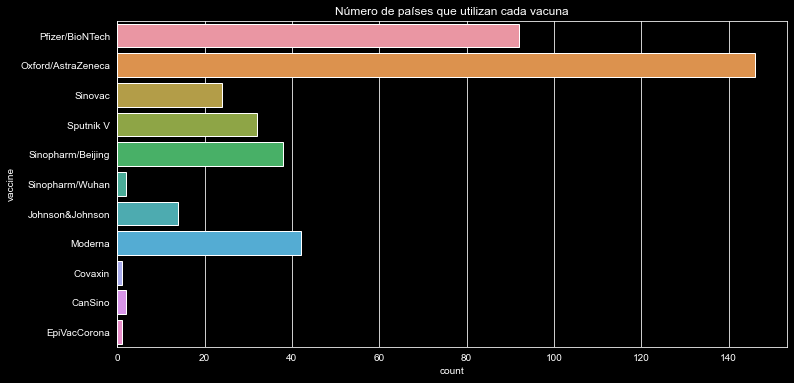

In [218]:
plt.figure(figsize=(12,6))
sns.countplot(y= "vaccine",data= map_plot_df)
plt.title('Número de países que utilizan cada vacuna')
plt.show()

In [219]:


fig = px.treemap(covid_vaccine_data,names = 'country',values = 'total_vaccinations',path = ['vaccines','country'],
                 title="Total Vaccinations per country grouped by Vaccines",
                 color_discrete_sequence =px.colors.qualitative.Set1)
fig.show()



In [220]:
#import geopandas

In [221]:
covid_vaccine_data.to_csv('covid_vaccine_data.csv')

# PARTE 2: España

### 1. Progresión de la vacunación diaria en España

In [222]:
vacc_Spain = covid_vaccine_data.loc[covid_vaccine_data.country == 'Spain']
vacc_Spain.set_index('date',inplace=True)

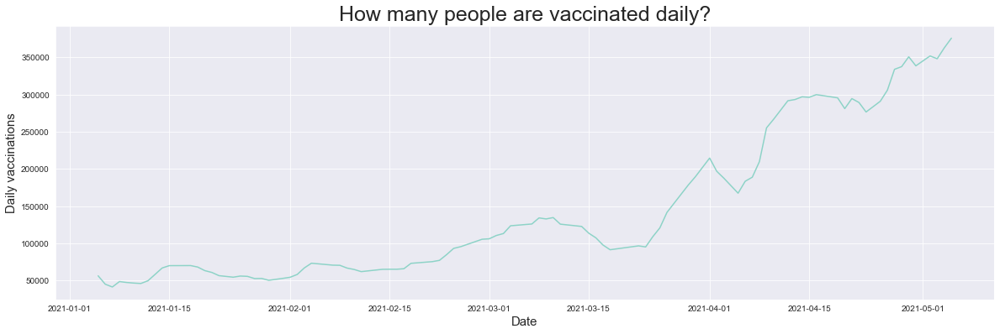

In [223]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data=vacc_Spain['daily_vaccinations'])
plt.title('How many people are vaccinated daily?',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Daily vaccinations', fontsize=15)
plt.show()

#### 1.1 Últimos 14 días

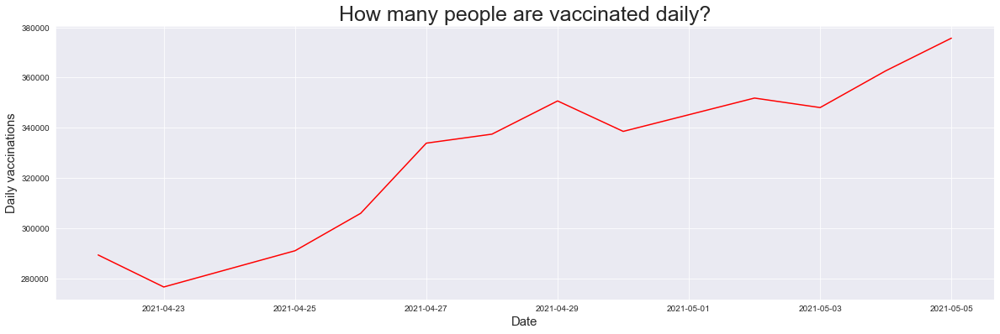

In [224]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data=vacc_Spain['daily_vaccinations'][-14:], color = 'r')
plt.title('How many people are vaccinated daily?',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Daily vaccinations', fontsize=15)
plt.show()

#### Estadísticas generales sobre la vacunación diaria

In [225]:
vacc_Spain.describe().daily_vaccinations

count       121.000000
mean     143285.628099
std       98481.118204
min       41496.000000
25%       66035.000000
50%      102279.000000
75%      196858.000000
max      375687.000000
Name: daily_vaccinations, dtype: float64

In [226]:
last_14_days = vacc_Spain[-14:]
last_14_days.shape

(14, 16)

Ahora observamos las estadísticas de los **últimos 14 días**:

In [227]:
last_14_days.describe().daily_vaccinations

count        14.000000
mean     327863.642857
std       32178.780669
min      276499.000000
25%      294675.500000
50%      337973.500000
75%      350001.500000
max      375687.000000
Name: daily_vaccinations, dtype: float64

Vemos que la media de vacunación ha subido bastante en los últimos 14 días. 

### 2. Pacientes totalmente vacunados vs no vacunados totalmente

In [228]:
fvacc_Spain = vacc_Spain.people_fully_vaccinated.tail(113)
nfvacc_Spain = vacc_Spain.people_vaccinated.tail(113)

Text(0, 0.5, 'Number of people')

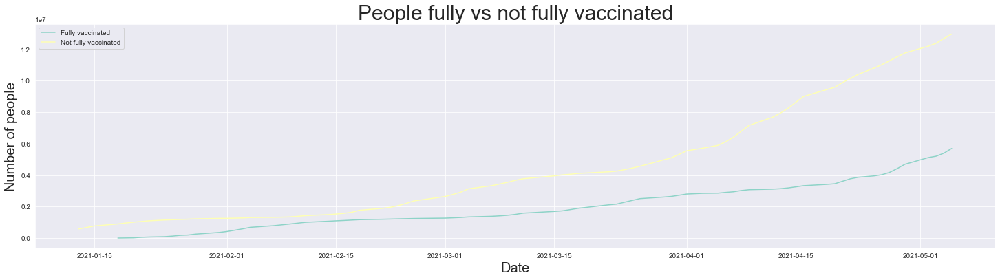

In [229]:
plt.figure(figsize=(25,6))
sns.lineplot(data=fvacc_Spain, label='Fully vaccinated')
sns.lineplot(data=nfvacc_Spain, label='Not fully vaccinated')

plt.title('People fully vs not fully vaccinated', fontsize=30)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of people', fontsize=20)

Text(0, 0.5, 'Number of people')

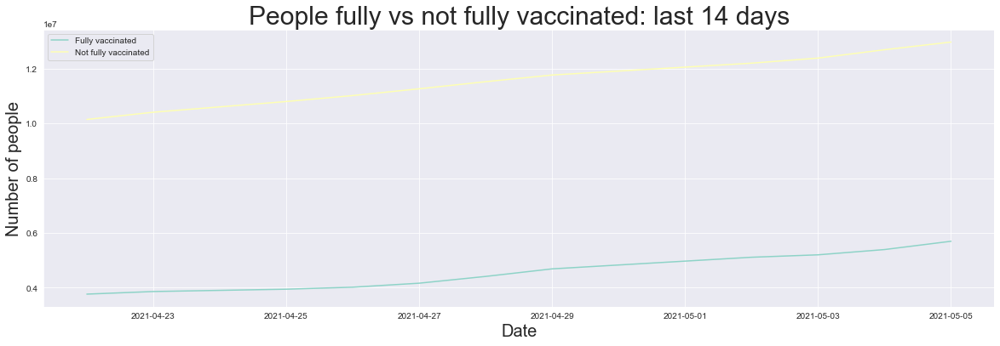

In [230]:
plt.figure(figsize=(20,6))
sns.lineplot(data=fvacc_Spain[-14:], label='Fully vaccinated')
sns.lineplot(data=nfvacc_Spain[-14:], label='Not fully vaccinated')

plt.title('People fully vs not fully vaccinated: last 14 days', fontsize=30)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of people', fontsize=20)

### Calculamos cuando España alcanzará la inmunidad de rebaño

In [231]:
vacc_Spain.columns

Index(['iso_code', 'country', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population',
       'Full_vaccinations(count)', 'Total_vaccinations(count)'],
      dtype='object')

In [232]:
vacc_Spain.head(5)

,iso_code,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population,Full_vaccinations(count),Total_vaccinations(count)
date,,,,,,,,,,,,,,,,
2021-01-04,ESP,Spain,82834.0,82834.0,NaN,NaN,0.18,0.18,NaN,NaN,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0
2021-01-05,ESP,Spain,139339.0,139339.0,NaN,56505.0,0.30,0.30,NaN,1209.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0
2021-01-06,ESP,Spain,NaN,NaN,NaN,45248.0,NaN,NaN,NaN,968.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0
2021-01-07,ESP,Spain,207323.0,207323.0,NaN,41496.0,0.44,0.44,NaN,888.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0
2021-01-08,ESP,Spain,277976.0,277976.0,NaN,48786.0,0.59,0.59,NaN,1043.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0


In [233]:
vacc_Spain.isnull().sum()

iso_code                                0
country                                 0
total_vaccinations                     35
people_vaccinated                      35
people_fully_vaccinated                44
daily_vaccinations                      1
total_vaccinations_per_hundred         35
people_vaccinated_per_hundred          35
people_fully_vaccinated_per_hundred    44
daily_vaccinations_per_million          1
vaccines                                0
source_name                             0
source_website                          0
Population                              0
Full_vaccinations(count)                0
Total_vaccinations(count)               0
dtype: int64

In [234]:
#vacc_Spain = vacc_Spain.fillna(vacc_Spain.median())
#vacc_Spain = vacc_Spain.fillna(0)

#interpolación de NaN
vacc_Spain['daily_vaccinations']= vacc_Spain['daily_vaccinations'].interpolate(method='linear')
vacc_Spain['total_vaccinations']= vacc_Spain['total_vaccinations'].interpolate(method='linear')
vacc_Spain['people_vaccinated']= vacc_Spain['people_vaccinated'].interpolate(method='linear')

vacc_Spain['people_fully_vaccinated']= vacc_Spain['people_fully_vaccinated'].interpolate(method='linear')
vacc_Spain['total_vaccinations_per_hundred']= vacc_Spain['total_vaccinations_per_hundred'].interpolate(method='linear')
vacc_Spain['people_vaccinated_per_hundred']= vacc_Spain['people_vaccinated_per_hundred'].interpolate(method='linear')

vacc_Spain['people_fully_vaccinated_per_hundred']=vacc_Spain['people_fully_vaccinated_per_hundred'].interpolate(method='linear')
vacc_Spain['daily_vaccinations_per_million']= vacc_Spain['daily_vaccinations_per_million'].interpolate(method='linear')


<ipython-input-234-ca105da20dc5>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-234-ca105da20dc5>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-234-ca105da20dc5>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-234-ca1

Quitamos los NaN con interpolación y la mediana

In [235]:
vacc_Spain = vacc_Spain.fillna(vacc_Spain.median())

In [236]:
vacc_Spain.isnull().sum()

iso_code                               0
country                                0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
Population                             0
Full_vaccinations(count)               0
Total_vaccinations(count)              0
dtype: int64

In [237]:
def preprocesado_pais(covid_vaccine_data,pais):
    """
    covid_vaccine_data: dataframe con todas las vacunas
    pais: pais que queremos escoger para analizar
    """
    vacc_pais = covid_vaccine_data.loc[covid_vaccine_data.country == pais]
    print(pais)
    vacc_pais.set_index('date',inplace=True)
    
    
    #crear una funcion de preprocesado
    vacc_pais['daily_vaccinations']= vacc_pais['daily_vaccinations'].interpolate(method='linear')
    vacc_pais['total_vaccinations']= vacc_pais['total_vaccinations'].interpolate(method='linear')
    vacc_pais['people_vaccinated']= vacc_pais['people_vaccinated'].interpolate(method='linear')

    vacc_pais['people_fully_vaccinated']= vacc_pais['people_fully_vaccinated'].interpolate(method='linear')
    vacc_pais['total_vaccinations_per_hundred']= vacc_pais['total_vaccinations_per_hundred'].interpolate(method='linear')
    vacc_pais['people_vaccinated_per_hundred']= vacc_pais['people_vaccinated_per_hundred'].interpolate(method='linear')

    vacc_pais['people_fully_vaccinated_per_hundred']=vacc_pais['people_fully_vaccinated_per_hundred'].interpolate(method='linear')
    vacc_pais['daily_vaccinations_per_million']= vacc_pais['daily_vaccinations_per_million'].interpolate(method='linear')
    
    vacc_pais = vacc_pais.fillna(vacc_pais.median())
    
    vacc_pais['date'] = vacc_pais.index
    vacc_pais["Days"]=vacc_pais.date - vacc_pais.date.min()
    vacc_pais["Days"]=vacc_pais["Days"].dt.days
    
    population = vacc_pais["Population"][1]
    vacc_pais['percentage_vaccinated'] = (vacc_pais.people_fully_vaccinated/population)*100
    
    return vacc_pais
    

Comenzamos con la predicción

In [238]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error,r2_score
import statsmodels.api as sm

from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.stattools import adfuller
#!pip install pyramid-arima
#from pyramid.arima import auto_arima
std=StandardScaler()

Añadimos una columna con los días

In [239]:
vacc_Spain['date'] = vacc_Spain.index

In [240]:
vacc_Spain["Days"]=vacc_Spain.date - vacc_Spain.date.min()
vacc_Spain.head(5)

,iso_code,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population,Full_vaccinations(count),Total_vaccinations(count),date,Days
date,,,,,,,,,,,,,,,,,,
2021-01-04,ESP,Spain,82834.0,82834.0,1624655.25,102279.0,0.18,0.18,3.47625,2188.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-04,0 days
2021-01-05,ESP,Spain,139339.0,139339.0,1624655.25,56505.0,0.30,0.30,3.47625,1209.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-05,1 days
2021-01-06,ESP,Spain,173331.0,173331.0,1624655.25,45248.0,0.37,0.37,3.47625,968.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-06,2 days
2021-01-07,ESP,Spain,207323.0,207323.0,1624655.25,41496.0,0.44,0.44,3.47625,888.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-07,3 days
2021-01-08,ESP,Spain,277976.0,277976.0,1624655.25,48786.0,0.59,0.59,3.47625,1043.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-08,4 days


In [241]:
vacc_Spain["Days"]=vacc_Spain["Days"].dt.days
vacc_Spain.head(5)

,iso_code,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population,Full_vaccinations(count),Total_vaccinations(count),date,Days
date,,,,,,,,,,,,,,,,,,
2021-01-04,ESP,Spain,82834.0,82834.0,1624655.25,102279.0,0.18,0.18,3.47625,2188.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-04,0
2021-01-05,ESP,Spain,139339.0,139339.0,1624655.25,56505.0,0.30,0.30,3.47625,1209.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-05,1
2021-01-06,ESP,Spain,173331.0,173331.0,1624655.25,45248.0,0.37,0.37,3.47625,968.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-06,2
2021-01-07,ESP,Spain,207323.0,207323.0,1624655.25,41496.0,0.44,0.44,3.47625,888.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-07,3
2021-01-08,ESP,Spain,277976.0,277976.0,1624655.25,48786.0,0.59,0.59,3.47625,1043.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-08,4


In [242]:
#vacc_Spain.Days

In [243]:
population = vacc_Spain["Population"][1]
vacc_Spain['percentage_vaccinated'] = (vacc_Spain.people_fully_vaccinated/population)*100

In [244]:
vacc_Spain.shape

(122, 19)

In [245]:
#vacc_Spain.head(10)

### Función de linear regression

In [246]:
## Función de linear regression
def prediction_linearreg(covid_vaccine_data, pais, valor_prediccion):
    """
    pais: string, con el país que queremos predecir
    valor_prediccion: valor de porcentaje de inmunidad que se quiere
    """
    #preprocesado_pais(covid_vaccine_data,pais)
    vacc_pais = preprocesado_pais(covid_vaccine_data, pais)
    
    #prediccion
    
    train_ml=vacc_pais.iloc[:int(vacc_pais.shape[0]*0.95)]
    valid_ml=vacc_pais.iloc[int(vacc_pais.shape[0]*0.95):]
    model_scores=[]
    
    print(train_ml.columns)
    
    lin_reg=LinearRegression(normalize=True)
    lin_reg.fit(np.array(train_ml["percentage_vaccinated"]).reshape(-1,1),np.array(train_ml["Days"]).reshape(-1,1))
    prediction_valid_linreg=lin_reg.predict(np.array(valid_ml["percentage_vaccinated"]).reshape(-1,1))
    
    model_scores.append(np.sqrt(mean_squared_error(valid_ml["Days"],prediction_valid_linreg)))
    print("Root Mean Square Error for Linear Regression: ",np.sqrt(mean_squared_error(valid_ml["Days"],prediction_valid_linreg)))
    mape = np.mean(np.abs((valid_ml["Days"].values - prediction_valid_linreg)/valid_ml["Days"].values))*100
    print("MAPE: ",mape)
    
    plt.figure(figsize=(11,6))
    prediction_linreg=lin_reg.predict(np.array(vacc_pais["percentage_vaccinated"]).reshape(-1,1))
    linreg_output=[]
    for i in range(prediction_linreg.shape[0]):
        linreg_output.append(prediction_linreg[i][0])

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=vacc_pais.percentage_vaccinated, y=vacc_pais["Days"],
                        mode='lines+markers',name="Train Data for Confirmed Cases"))
    fig.add_trace(go.Scatter(x=vacc_pais.percentage_vaccinated, y=linreg_output,
                        mode='lines',name="Linear Regression Best Fit Line",
                        line=dict(color='black', dash='dot')))
    fig.update_layout(title="Fully vaccinated Linear Regression Prediction",
                     xaxis_title="percentage vaccinated",yaxis_title="Days",legend=dict(x=0,y=1,traceorder="normal"))
    fig.show()
    
    prediccion = lin_reg.predict(np.array(valor_prediccion).reshape(-1,1))
    print("Faltan",round(prediccion[0][0]),"días para alcanzar la inmunidad de rebaño.")
    
    #return prediccion
    

In [247]:
prediction_linearreg(covid_vaccine_data,"Spain", 70)

Spain
Index(['iso_code', 'country', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population',
       'Full_vaccinations(count)', 'Total_vaccinations(count)', 'date', 'Days',
       'percentage_vaccinated'],
      dtype='object')
Root Mean Square Error for Linear Regression:  25.239290089906646
MAPE:  20.784070028888888


<ipython-input-237-2943a3772073>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-

Faltan 852 días para alcanzar la inmunidad de rebaño.


<Figure size 792x432 with 0 Axes>

In [248]:
def polynomial_regression(covid_vaccine_data, pais, valor_prediccion, degree):
    """
    pais: string, con el país que queremos predecir
    valor_prediccion: valor de porcentaje de inmunidad que se quiere
    """
    #preprocesado_pais(covid_vaccine_data,pais)
    vacc_pais = preprocesado_pais(covid_vaccine_data, pais)
    
    #prediccion
    train_ml=vacc_pais.iloc[:int(vacc_pais.shape[0]*0.95)]
    valid_ml=vacc_pais.iloc[int(vacc_pais.shape[0]*0.95):]
    model_scores=[]
    
    #print(train_ml.columns)
    
    # 
    
    poly = PolynomialFeatures(degree = degree) 
    
    train_poly=poly.fit_transform(np.array(train_ml["percentage_vaccinated"]).reshape(-1,1))
    valid_poly=poly.fit_transform(np.array(valid_ml["percentage_vaccinated"]).reshape(-1,1))
    y=train_ml["Days"]
    
    linreg=LinearRegression(normalize=True)
    linreg.fit(train_poly,y)
    
    prediction_poly=linreg.predict(valid_poly)
    rmse_poly=np.sqrt(mean_squared_error(valid_ml["Days"],prediction_poly))
    model_scores.append(rmse_poly)
    print("Root Mean Squared Error for Polynomial Regression: ",rmse_poly)
    mape = np.mean(np.abs((valid_ml["Days"].values - prediction_poly)/valid_ml["Days"].values))*100
    print("MAPE: ",mape)
    
    comp_data=poly.fit_transform(np.array(vacc_pais["percentage_vaccinated"]).reshape(-1,1))
    plt.figure(figsize=(11,6))
    predictions_poly=linreg.predict(comp_data)

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=vacc_pais.percentage_vaccinated, y=vacc_pais["Days"],
                        mode='lines+markers',name="Train Data for Confirmed Cases"))
    fig.add_trace(go.Scatter(x=vacc_pais.percentage_vaccinated, y=predictions_poly,
                        mode='lines',name="Polynomial Regression Best Fit",
                        line=dict(color='black', dash='dot')))
    fig.update_layout(title="Confirmed Cases Polynomial Regression Prediction",
                     xaxis_title="percentage vaccinated",yaxis_title="Days",
                     legend=dict(x=0,y=1,traceorder="normal"))
    fig.show()
    
    prediccion = linreg.predict(poly.fit_transform([[valor_prediccion]]))
    print(prediccion)
    
    #prediccion = lin_reg.predict(np.array(valor_prediccion).reshape(-1,1))
    print("Faltan",round(prediccion[0]),"días para alcanzar la inmunidad de rebaño.")
    
    

**Polynomial Regression**

In [249]:
polynomial_regression(covid_vaccine_data, 'Spain', 70, 3)

Spain
Root Mean Squared Error for Polynomial Regression:  10.279648789952446
MAPE:  6.083212410440716


<ipython-input-237-2943a3772073>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-

[-57386.45578487]
Faltan -57386 días para alcanzar la inmunidad de rebaño.


<Figure size 792x432 with 0 Axes>

In [250]:
import statsmodels.api as sm
from statsmodels.tsa.api import Holt,SimpleExpSmoothing,ExponentialSmoothing
#from fbprophet import Prophet
from statsmodels.tsa.stattools import adfuller



### Holt's Linear Model

The Holt linear is completely different from the first two methods. Holt linear attempts to capture the high-level trends in the time series data and fits the data with a straight line. The method can be summarized as follows:

In [251]:
vacc_Spain

,iso_code,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population,Full_vaccinations(count),Total_vaccinations(count),date,Days,percentage_vaccinated
date,,,,,,,,,,,,,,,,,,,
2021-01-04,ESP,Spain,8.283400e+04,8.283400e+04,1.624655e+06,102279.0,0.18,0.18,3.476250,2188.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-04,0,3.451075
2021-01-05,ESP,Spain,1.393390e+05,1.393390e+05,1.624655e+06,56505.0,0.30,0.30,3.476250,1209.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-05,1,3.451075
2021-01-06,ESP,Spain,1.733310e+05,1.733310e+05,1.624655e+06,45248.0,0.37,0.37,3.476250,968.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-06,2,3.451075
2021-01-07,ESP,Spain,2.073230e+05,2.073230e+05,1.624655e+06,41496.0,0.44,0.44,3.476250,888.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-07,3,3.451075
2021-01-08,ESP,Spain,2.779760e+05,2.779760e+05,1.624655e+06,48786.0,0.59,0.59,3.476250,1043.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-01-08,4,3.451075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-01,ESP,Spain,1.690724e+07,1.205184e+07,4.972321e+06,345164.0,36.16,25.78,10.636667,7382.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-05-01,117,10.562151
2021-05-02,ESP,Spain,1.717857e+07,1.219608e+07,5.113598e+06,351805.0,36.74,26.09,10.940000,7524.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-05-02,118,10.862251
2021-05-03,ESP,Spain,1.743081e+07,1.238121e+07,5.202297e+06,348020.0,37.28,26.48,11.130000,7444.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.mscbs.gob.es/profesionales/saludPu...,47076781.0,5696827.0,18489580.0,2021-05-03,119,11.050664


In [252]:
def Holt_regression(covid_vaccine_data, pais, valor_prediccion):
    """
    pais: string, con el país que queremos predecir
    valor_prediccion: valor de porcentaje de inmunidad que se quiere
    """
    #preprocesado_pais(covid_vaccine_data,pais)
    vacc_pais = preprocesado_pais(covid_vaccine_data, pais)
    
    #prediccion
    model_train=vacc_pais.iloc[:int(vacc_pais.shape[0]*0.95)]
    valid=vacc_pais.iloc[int(vacc_pais.shape[0]*0.95):]
    y_pred=valid.copy()
    model_scores=[]
    
    #print(valid)
    
    
    #Holt
    
    #holt=Holt(np.asarray(model_train["Days"])).fit(smoothing_level=0.4, smoothing_slope=0.4,optimized=False)
    
    print(model_train["Days"])
    holt=Holt(np.asarray(model_train["Days"])).fit()
    
    y_pred["Holt"]=holt.forecast(len(valid))
    
    print(y_pred["Holt"])

    model_scores.append(np.sqrt(mean_squared_error(y_pred["Days"],y_pred["Holt"])))
    print("Root Mean Square Error Holt's Linear Model: ",np.sqrt(mean_squared_error(y_pred["Days"],y_pred["Holt"])))
    mape = np.mean(np.abs((y_pred["Days"].values - y_pred["Holt"])/y_pred["Days"].values))*100
    print("MAPE: ",mape)
    
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=model_train.percentage_vaccinated, y=model_train["Days"],
                        mode='lines+markers',name="Train Data for days"))
    fig.add_trace(go.Scatter(x=valid.percentage_vaccinated, y=valid["Days"],
                        mode='lines+markers',name="Validation Data for percentage vaccinated",))
    fig.add_trace(go.Scatter(x=valid.percentage_vaccinated, y=y_pred["Holt"],
                        mode='lines+markers',name="percentage vaccinated",))
    fig.update_layout(title="Percentage vaccinated Holt's Linear Model Prediction",
                     xaxis_title="percentage",yaxis_title="Days",legend=dict(x=0,y=1,traceorder="normal"))
    fig.show()
    
    prediccion= holt.predict(valor_prediccion)
    print(prediccion)
    ultima_fecha = vacc_pais["Days"][-1] + 1
    print(ultima_fecha)

    ultima_prediccion = prediccion[-1] - ultima_fecha
    print("Faltan",round(ultima_prediccion),"días para alcanzar la inmunidad de rebaño.")
    
    #print(train_ml.columns)

In [253]:
#Holt_regression(covid_vaccine_data, "Spain", 70)

### Otro países: Reino Unido

In [254]:
#covid_vaccine_data

In [255]:
Holt_regression(covid_vaccine_data,"Spain", 70)

Spain
date
2021-01-04      0
2021-01-05      1
2021-01-06      2
2021-01-07      3
2021-01-08      4
             ... 
2021-04-24    110
2021-04-25    111
2021-04-26    112
2021-04-27    113
2021-04-28    114
Name: Days, Length: 115, dtype: int64
date
2021-04-29    114.999992
2021-04-30    115.999984
2021-05-01    116.999976
2021-05-02    117.999968
2021-05-03    118.999959
2021-05-04    119.999951
2021-05-05    120.999943
Name: Holt, dtype: float64

<ipython-input-237-2943a3772073>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-


Root Mean Square Error Holt's Linear Model:  3.628466731752776e-05
MAPE:  2.7285099433799343e-05


[ 69.99998363  70.99998388  71.99998413  72.99998437  73.99998461
  74.99998485  75.99998508  76.99998531  77.99998554  78.99998576
  79.99998598  80.9999862   81.99998641  82.99998662  83.99998682
  84.99998703  85.99998723  86.99998742  87.99998762  88.99998781
  89.999988    90.99998818  91.99998836  92.99998854  93.99998872
  94.99998889  95.99998906  96.99998923  97.9999894   98.99998956
  99.99998972 100.99998988 101.99999003 102.99999019 103.99999034
 104.99999049 105.99999063 106.99999078 107.99999092 108.99999106
 109.9999912  110.99999133 111.99999147 112.9999916  113.99999173]
122
Faltan -8 días para alcanzar la inmunidad de rebaño.


In [256]:
#vacc_pais = covid_vaccine_data.loc[covid_vaccine_data.country == ""]

In [257]:
prediction_linearreg(covid_vaccine_data, "India", 70)

India
Index(['iso_code', 'country', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population',
       'Full_vaccinations(count)', 'Total_vaccinations(count)', 'date', 'Days',
       'percentage_vaccinated'],
      dtype='object')
Root Mean Square Error for Linear Regression:  8.680352202687313
MAPE:  7.493334020968106


<ipython-input-237-2943a3772073>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-

Faltan 3074 días para alcanzar la inmunidad de rebaño.


<Figure size 792x432 with 0 Axes>

In [258]:
polynomial_regression(covid_vaccine_data, "France", 70, 2)

France
Root Mean Squared Error for Polynomial Regression:  33.39019907058517
MAPE:  25.98959271069091


<ipython-input-237-2943a3772073>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-2943a3772073>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-237-

[3478.00371165]
Faltan 3478 días para alcanzar la inmunidad de rebaño.


<Figure size 792x432 with 0 Axes>